# <center>Digital Image Processing - Problem Set 3</center>

### Student Names:
Jorge Ortega, Sebastian Salas, Katerine Vera

### Instructions

This Problem Set covers the topics of frequency domain filtering and color image processing.<br>

Your solutions to the following problems should include commented source code and a short description of each function. You should test your functions with several input images, besides the ones provided here. Include the input and output images that you used for experimentation. Analyze your results. If you discover something interesting, let us know!

In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from os import listdir, path

images = listdir("ima")
for ind,img in enumerate(images):                #Se crea lista de imagenes
    images[ind]="ima/"+img 
print(images, len(images))



FileNotFoundError: [Errno 2] No such file or directory: 'ima'

### Problem 1

Visualize the Fourier spectrum of an image. Write a function that visualizes the spectrum of an input gray-scale image. The function should perform the following steps:

1. Compute the FFT of the input image using the FFT function <tt>numpy.fft.fft2</tt>.
2. Shift the transform to center the origin in the middle of the image using <tt>numpy.fft.fftshift</tt>.
3. The Fourier transform contains complex numbers, so we usually analyze its phase and spectrum components. Write commands that compute the Fourier spectrum from the shifted Fourier transform.
4. The resulting spectrum is difficult to visualize if plotted directly. Instead, we usually apply a logarithmic intensity transform to the spectrum before visualizing. Use the <tt>numpy.log</tt> function to accomplish this.
5. Plot the modified spectrum.

Test your function by applying it to the images <tt>face.png</tt>, <tt>blown_ic.png</tt>, <tt>test_pattern_blurring_orig.png</tt>, <tt>translated_rectangle.png</tt> and <tt>rectangle.png</tt>.

Please comment your results.

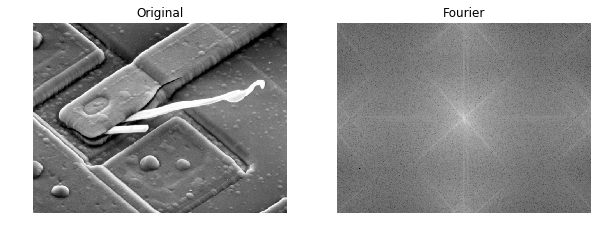

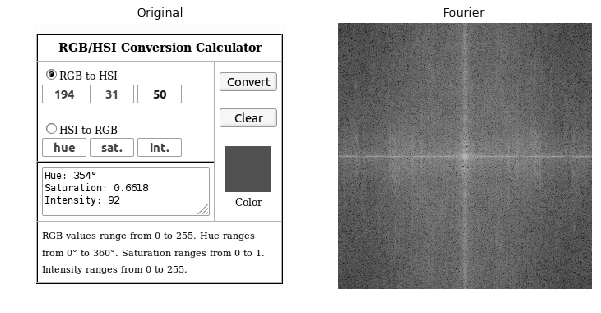

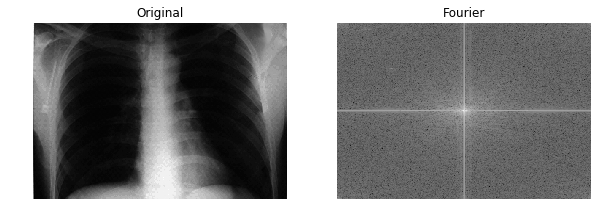

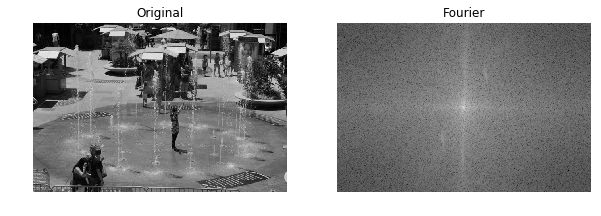

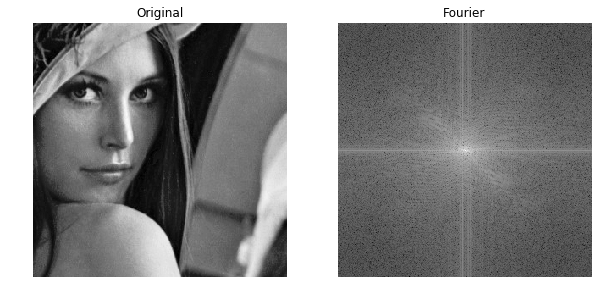

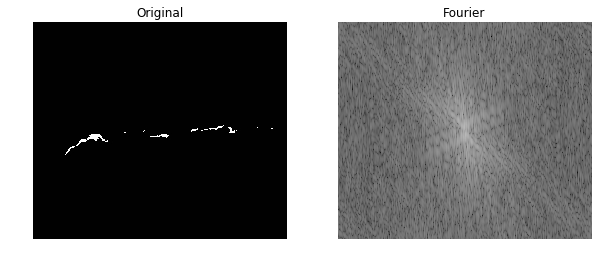

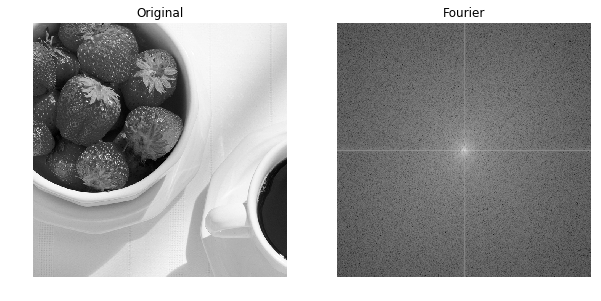

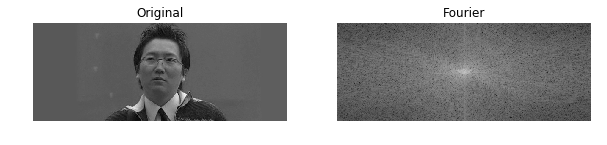

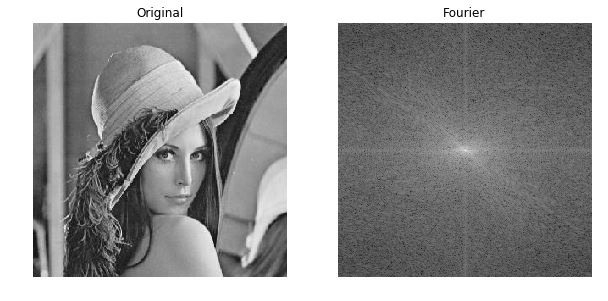

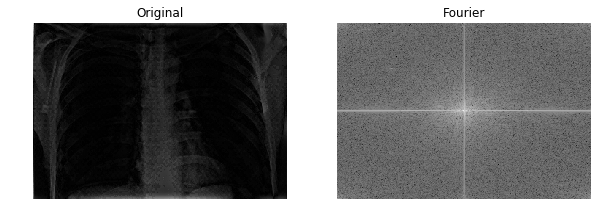

In [70]:
def get_Fourier(img):                                # Funcion que regresa el espectro en fourier de la imagen parametro
    img_fft = np.fft.fftshift(np.fft.fft2(img))      # Se obtiene el fft y se hace el shift para centrar los datos
    spec    = np.log(np.abs(img_fft))                # Se saca la magnitud de la transf. y se aplica el log
    return spec


# Se prueba la funcion con varias imagenes

for i in range(0,10):
    
    img  = cv2.imread(images[i],cv2.IMREAD_GRAYSCALE) # Se carga la imagen original
    imgf = get_Fourier(img)                          # Se carga el fourier de la imagen
    
    #Original
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    
    plt.imshow(img,cmap="gray")                      # Se muestra la imagen original
    plt.axis("off")
    plt.title("Original")

    # Fourier
    plt.subplot(1,2,2)
    
    plt.imshow(imgf,cmap="gray")                     # Se muestra el espectro en fourier
    plt.axis("off")
    plt.title("Fourier")

    plt.show()



De lo anterior podemos resaltar que para calcular el espectro de la transformada de fourier a imagenes en escala de grises es necesario aplicar la fft y aplicarle a su vez shift para centrar los datos. Posteriormente, calcular la magnitud del espectro y su logaritmo natural. Finalmente, a un grupo de imagenes se les aplica la funcion creada para calcular el espectro. Se puede observar claramente un arreglo de imagenes, donde al lado derecho vemos las originales y del lado iquierdo su respectivo espectro de la transformada de fourier.

### Problem 2

Frequency domain filtering. Write a PYTHON function that performs high-frequency emphasis (hfe) filtering. Recall that an hfe filter is defined as:
\begin{equation}
H_{hfe}(u,v) = a + b \cdot H_{hp}(u,v)
\end{equation}
where $a$ is the offset, $b$ is the high-frequency amplification and $H_{hp}$ is the transfer function of a high-pass filter. Your function should be based on a second-order high-pass Butterworth filter with a cut-off frequency $D_0$, which is given by:
\begin{equation}
H_{hp}(u,v) = \frac{1}{1 + \left[\frac{D_0}{D(u,v)}\right]^{2n}}.
\end{equation}
<b>Note. </b> $D(u,v)$ measures the Euclidean distance from the point $(u,v)$ to the center of the frequency plane.

Use your function and filters on the image <tt>chest.jpg</tt> to reproduce the image enhancement illustrated below.

<img src="files/chest.jpg"/ width=200> <img src="files/out.png"/width=200>

The outline of the process is the following:

1. Create a high-pass Butterworth filter with a frequency domain dimension of 2 times the size of the input image. Plot the filter image.
2. Compute the FFT of the input image using the function <tt>numpy.fft.fft2</tt>. The FFT should have frequency domain dimensions equal to the dimensions of the filter, which should be set using the input parameters of the <tt>fft2</tt> function. Plot the FFT image.
3. Filter the image using the high-pass Butterworth filter. To filter an image in the frequency domain, you should multiply the fourier transform of the image and the frequency response of the filter. To go back to the spatial domain, you need to apply the inverse FFT and take the real component of the resut. Plot the resulting image.
4. Create a high-frequency emphasis filter based on the Butterworth filter of step 1. Plot the filter image.
5. Filter the image using a high-frequency emphasis filter. Plot the resulting image.
6. After filtering, you may need to stretch the intensity values of each resulting image to the range [0, 255]. You can achieve this by substracting the minimum intensity value, dividing by the maximum and multiplying the result by 255.
7. Apply histogram equalization to the image obtained in the previous step. You should obtain a similar result to that shown above.

Use the following parameters for the filters: $a = 0.5$, $b = 2$, $n=2$ and $D_0$ should be set to $5\%$ of the vertical dimension of the filter.

Please comment your results.

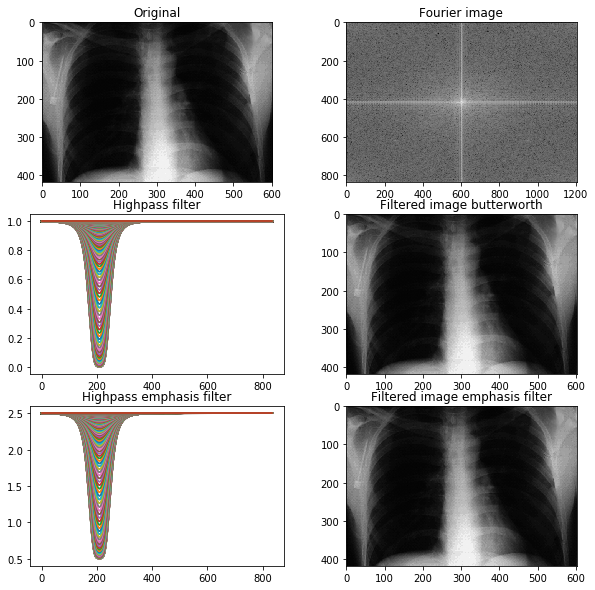

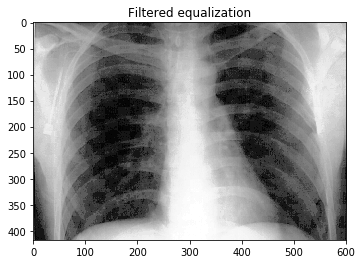

In [71]:
def filt(img):                     #Función del filtro paso alta Butterworth
    h,w = img.shape                #Parametros de medida de la imagene ancho (w) y alto(h)
    a = 0.5                        #Parametro de offset 0.5
    b = 2                          # Amplificación de alta frecuencia
    n = 2
    D_o = 0.05*h*2                 #frecuencia de corte del filtro 2 veces la dimension de la imagen
    H_hfe = np.zeros((2*h,2*w))    #se crea una matriz de ceros de la dimension 2 veces el de la imagen del fitro de enfasis de alta frecuencia
    H_hp = np.zeros((2*h,2*w))     #se crea una matriz de ceros de la dimension 2 veces el de la imagen del filtro de segundo orden en alta frecuencia
    for u in range(2*h):           #Arreglo for para recorrer la imagen y aplicar el filtro con las formulas dadas
        for v in range(2*w):       # de los puntos (u,v) 
            dist = 10e-25+(np.abs((h/2)-u)**2+np.abs((w/2)-v)**2)**0.5  #Calculo de la distancia euclidiana entre los puntos
            H_hp[u][v] = 1/(1+(D_o/dist)**(2*n))             #filtro paso alto Butterworth de segundo orden 
            H_hfe[u][v] = a+b*H_hp[u][v]                     #filtro de enfasis paso alto
    
    img_fft = np.fft.fftshift(np.fft.fft2(img,[h*2,w*2]))   #calculo del espectro de la transformada de furier de la imagen
    
    img_buf = img_fft*H_hp                                  #imagen de salida multiplicada por el filtro paso alta Butterworth
    filtb_img = np.fft.ifft2(np.fft.ifftshift(img_buf))     #inversa de la transformada de furier de la imagen filtrada
    filtb = np.abs(filtb_img)                               #se calcula la magnitud de la imagen filtrada
    filtb = filtb[:h,:w]                                    
    
    img_hfe = img_fft*H_hfe                                 #imagen de salida multiplicada por el filtro de enfasis paso alta 
    filte_img = np.fft.ifft2(np.fft.ifftshift(img_hfe))     #inversa de la transformada de furier de la imagen filtrada
    filte = np.abs(filte_img)                                #se calcula la magnitud de la imagen filtrada
    filte = filte[:h,:w]
    
    filte_equ = np.zeros((h,w))                            #matriz de ceros con medida original de la imagen
    min_in=np.min(filte)                                   #matriz de valores minimos de la imagen filtrada
    max_in=np.max(filte)                                   #matriz de valores maximos de la imagen filtrada   
    for i in range(h):                                     #arreglo for para aplicar ecualizacion a la imagen filtrada  
        for j in range(w):
            filte_equ[i][j]=((filte[i][j]-min_in)/max_in)*255
    
    filte_equ=cv2.equalizeHist(filte_equ.astype(np.uint8)) 
    

    return [H_hp, H_hfe, img_fft, filtb, filte, filte_equ]     

img=cv2.imread(images[2],cv2.IMREAD_GRAYSCALE)                #lectura de la imagen original
[Hp,Hfe,fftimg,filteredHp,filteredHpe,filtequ]=filt(img)      #parametros de entrada necesarios para usar la funcion creada


plt.figure(figsize=(10,10))   #se muestra la imagen original
plt.subplot(3,2,1)
plt.imshow(img,cmap="gray")
plt.title("Original")

plt.subplot(3,2,2)     #se muestra el espectro de la transformada de fourier de la imagen
plt.imshow(np.log(np.abs(fftimg)),cmap="gray")  
plt.title("Fourier image")

plt.subplot(3,2,3) #se muestra el filtro butterworth paso alta aplicado a la imagen
plt.plot(Hp)
plt.title("Highpass filter")          

plt.subplot(3,2,4) #se muestra la imagen filtrada de butterworth
plt.imshow(filteredHp,cmap="gray")
plt.title("Filtered image butterworth")   

plt.subplot(3,2,5) #se muestra el filtro de enfasis paso alta aplicado a la imagen
plt.plot(Hfe)
plt.title("Highpass emphasis filter") 

plt.subplot(3,2,6) #se muestra la imagen filtrada del filtro de enfasis
plt.imshow(filteredHpe,cmap="gray")
plt.title("Filtered image emphasis filter")

plt.show()

plt.imshow(filtequ,cmap="gray")   #se muestra la imagen ecualizada despues de aplicar el filtro
plt.title("Filtered equalization")
plt.show()
    

De lo anterior podemos concluir que al usar el filtro paso alta de butterworth de segundo orden se producen cambios de paso en los niveles de grises y se realzan los detalles finos de la imagen como las lineas delgadas, sin embargo no se ve hasta ecualizarse la imagen. Al usar el filtro de enfasis en alta frecuencias, se destacan los bordes, formas de la imagen. Finalmente al ecualizar la imagen filtrada con el enfasis de alta frecuecia que depende del filtro Butterworth, se pueden observar mas los bordes y detalles de la imagen que antes no eran observados. La ecualización realiza una distribucion homogenea de los pixeles de la imagen.

### Problem 3

Color spaces. Write a function that converts an image from the RGB color
space to HSI color space. Write another function that converts an image from the HSI
color space to RGB color space. You should use the homework equations to implement these conversions.

When plotting images in the HSI space, you should plot each channel separately, using one image for the H channel, another for the S channel and another for the I channel.

Test your function converting images from RGB to HSI and back to RGB.

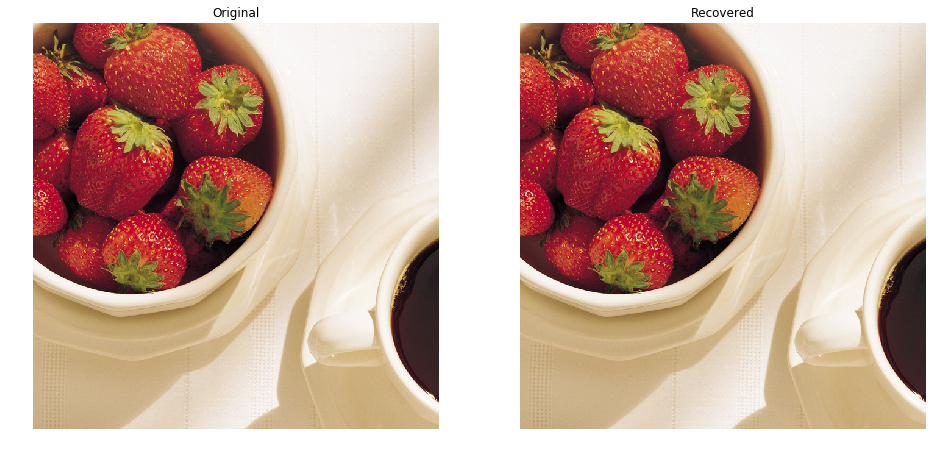

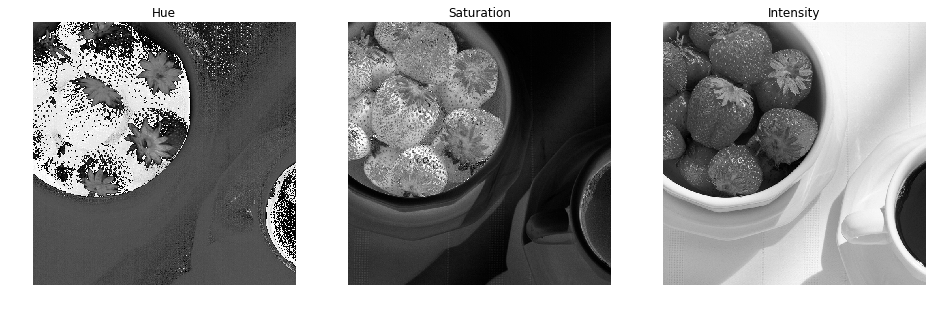

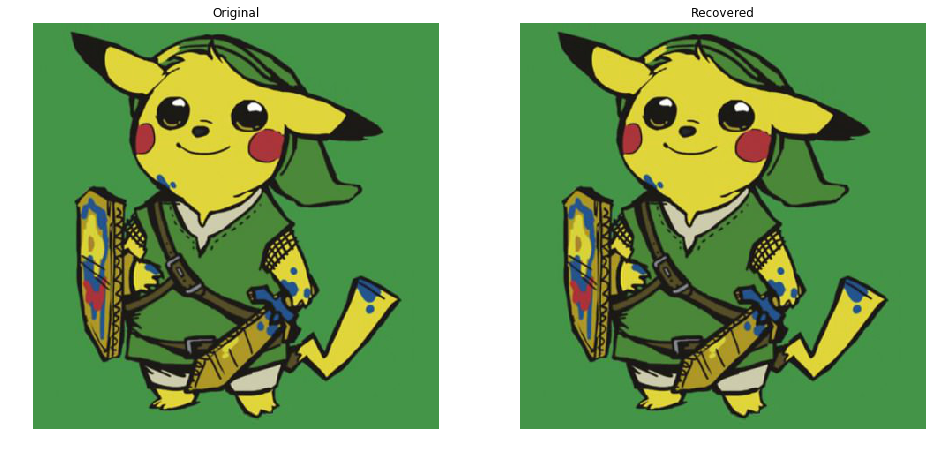

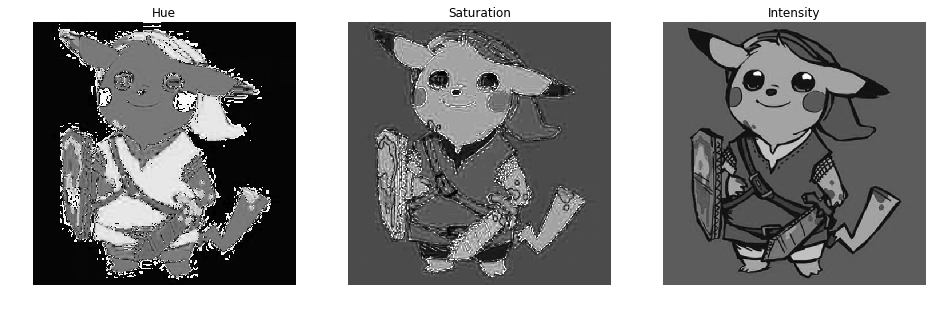

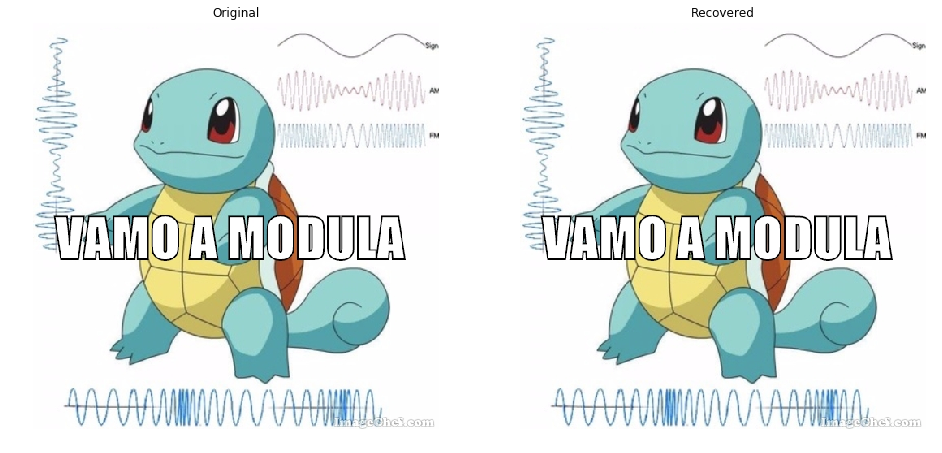

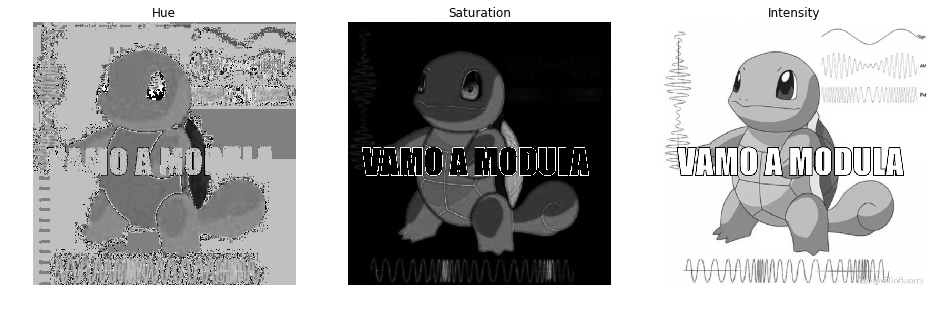

In [72]:
def RGB2HSI(img):   #Funcion para pasar de RGB a HSI
    height,widht,_= img.shape        #se obtienen las dimensiones de la imagen
    S=np.zeros((height,widht))       #se crea una matriz de ceros con las dimensiones de la imagen para la saturacion
    H=np.zeros((height,widht))       #se crea una matriz de ceros con las dimensiones de la imagen para la matiz
    I=np.zeros((height,widht))       #se crea una matriz de ceros con las dimensiones de la imagen para la intensidad
    for i in range(0,height):        #se crea un arreglo que recorra la imagen de acuerdo a sus dimensiones
        for j in range(0,widht):
            B=img[i][j][0]/255       #se estandarizan los valores de los pixeles de la matrix B entre 0 y 255.   
            G=img[i][j][1]/255       #se estandarizan los valores de los pixeles de la matrix G entre 0 y 255.
            R=img[i][j][2]/255        #se estandarizan los valores de los pixeles de la matrix R entre 0 y 255.
            #se aplica la formula para obtener en el parametro w los valores de RGB
            w = (((R-G)+(R-B))/(1e-72+(((R-G)**2)+(R-B)*(G-B))**0.5))*0.5  
            H[i][j]=np.rad2deg(np.arccos(w))     #se calcula el angulo que representa la matiz de la imagen degrado
            I[i][j]=(1/3)*(R+G+B)                #se calcula la intensidad con la formula consultada
            S[i][j]=1-3*(np.min((R,G,B)))/(R+G+B+1e-72)  #se calcula la saturacion con la formula consultada
            if B>G:         #si B es mayor que G entonces el angulo debe ser complementario para no usar el negativo
                H[i][j]=360-H[i][j]
    return [H,S,I]

def HSI2RGB(H,S,I):   #Funcion para pasar de  HSI a RGB
    R=np.zeros(S.shape)  #se crea una matriz de ceros con las dimensiones de la imagen para la matriz de rojo
    G=np.zeros(S.shape)  #se crea una matriz de ceros con las dimensiones de la imagen para la matriz de verde
    B=np.zeros(S.shape)  #se crea una matriz de ceros con las dimensiones de la imagen para la matriz de azul
    for i in range(0,len(S)):   #se crea un arreglo que recorra las dimensiones de la matriz de saturacion
        for j in range(0,len(S[0])):
           # si el valor del pixel de la matriz de H es menor de 120 se aplican las ecuaciones siguientes para calcular las valores correspondientes de RGB
            if H[i][j]<120:    
                B[i][j]=I[i][j]*(1-S[i][j])
                R[i][j]=I[i][j]*(1+((S[i][j]*np.rad2deg(np.cos(np.deg2rad(H[i][j]))))/(np.rad2deg(np.cos(np.deg2rad(60-H[i][j]))))))
                G[i][j]=3*I[i][j]-(R[i][j]+B[i][j])
            # si el valor del pixel de la matriz de H es menor está entre 120 y 240 se aplican las ecuaciones siguientes para calcular las valores correspondientes de RGB
            if H[i][j]>=120 and H[i][j]<240:
                H[i][j]=H[i][j]-120
                R[i][j]=I[i][j]*(1-S[i][j])
                G[i][j]=I[i][j]*(1+((S[i][j]*np.rad2deg(np.cos(np.deg2rad(H[i][j]))))/(np.rad2deg(np.cos(np.deg2rad(60-H[i][j]))))))
                B[i][j]=3*I[i][j]-(R[i][j]+G[i][j])
            # si el valor del pixel de la matriz de H es mayor a 240 se aplican las ecuaciones siguientes para calcular las valores correspondientes de RGB
            if H[i][j]>=240:
                H[i][j]=H[i][j]-240
                G[i][j]=I[i][j]*(1-S[i][j])
                B[i][j]=I[i][j]*(1+((S[i][j]*np.rad2deg(np.cos(np.deg2rad(H[i][j]))))/(np.rad2deg(np.cos(np.deg2rad(60-H[i][j]))))))
                R[i][j]=3*I[i][j]-(B[i][j]+G[i][j])
    
    return [R,G,B]

imrow=[6,11,18]

for i in imrow:
    img = cv2.imread(images[i],cv2.IMREAD_COLOR) # se lee la imagen 
    [H,S,I] = RGB2HSI(img)  #se toma como parametro de entrada la imagen en la funcion que extrae los parametros de HSI
    [R,G,B] = HSI2RGB(H,S,I) #los parametros obtenidos del paso anterior son ahora los parametros de entrada para pasar a RGB
    img2 = cv2.merge((R,G,B)) #merge junta las tres matrices para crear la nueva imagen
    plt.figure(figsize=(16,16)) 
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title("Original")  # se muestra la imagen original
    plt.subplot(1,2,2)
    plt.imshow(img2)
    plt.axis("off")
    plt.title("Recovered") #se muestra la imagen procesada de RGB a HSI y nuevamente a RGB 

    plt.figure(figsize=(16,16))
    plt.subplot(1,3,1) #se muestra el canal H matiz de la imagen
    plt.imshow(H,cmap="gray") #visualizacion en escala de grises
    plt.axis("off")
    plt.title("Hue")
    plt.subplot(1,3,2) #se muestra el canal S saturacion de la imagen
    plt.imshow(S,cmap="gray") #visualizacion en escala de grises
    plt.axis("off")
    plt.title("Saturation")
    plt.subplot(1,3,3) #se muestra el canal I intensidad de la imagen
    plt.imshow(I,cmap="gray") #visualizacion en escala de grises
    plt.axis("off")
    plt.title("Intensity")

    plt.show()

### Problem 4

Manipulating color images. Write a function that converts a color image from the RGB to
the HSI color space, modifies the ‘I’ channel by applying histogram equalization, and revert
back the image to the RGB color space. Apply this function to enhance the image <tt>dark_fountain.jpg</tt>.

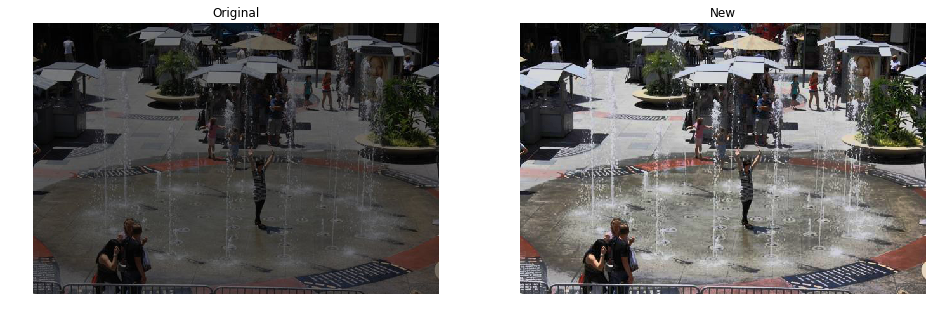

In [73]:
def iluminate(img):                                       #Funcion para aumentar la intensidad de las imagenes de entrada
    [H,S,I] = RGB2HSI(img)                                #Se pasa la imagen al espacio HSI
    I=I*255                                               #Se pasa la escala de intensidad de [0,1] a [0,255]
    I = cv2.equalizeHist(I.astype(np.uint8))              #Se equaliza la matriz de intensidad
    I = np.array(I, np.float32)/255                       #Se regresa la matriz al rango [0,1] pasando al tipo float
    [R,G,B] = HSI2RGB(H,S,I)                              #Se obtienen las matrices de RGB de la nueva imagen
    result = cv2.merge((R,G,B))                           #Se crea la imagen
    #Se normaliza los valores de la imagen para que se encuentre en el rango de 0 a 255
    result = cv2.normalize(result,result, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    return result
#Se lee la imagen
img = cv2.imread(images[3],cv2.IMREAD_COLOR)
#Se aplica la funcion de iluminacion
img_new=iluminate(img)
#Se muestran las imagenes resultantes y la original
plt.figure(figsize=(16,16))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title("Original")
plt.subplot(1,2,2)
plt.imshow(img_new)
plt.axis("off")
plt.title("New")
plt.show()

### Problem 5 

Manipulating color images. Consider the RGB color image <tt>squares.jpg</tt>, where the
squares are pure red, green and blue.

<img src="files/squares.jpg" width=200 />

1. Convert this image to the HSI color space. Blur the H component of the image using a 25x25 averaging mask, and convert it back to RGB. How do you explain the obtained result?
2. Repeat, blurring only the saturation component this time. How do you explain the result?


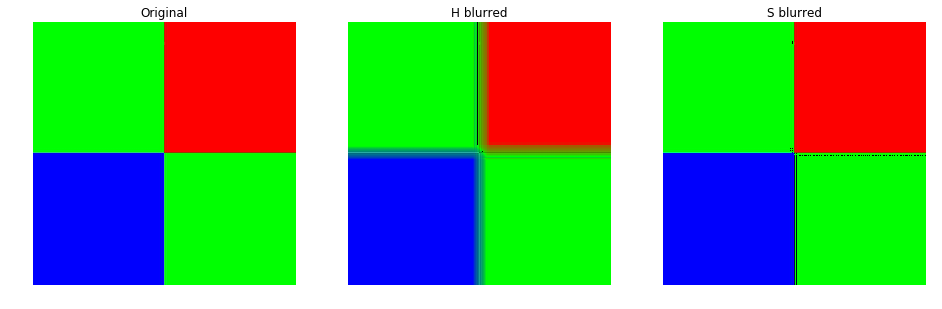

In [74]:
def smooth_image(img_input, kernel_size):                          ##funcion para aplicar filtro kernel
    kernel = np.ones((kernel_size, kernel_size))/ kernel_size**2   ##aplicacion de la formula para el filtro kernel
    img_out = cv2.filter2D(img_input, cv2.CV_8U, kernel)           #8U elimina bits valores negativos a bits
    return img_out

def blurr_comp(img):                                               #Funcion para hacer borrosa la matriz de hue y saturacion
    [H,S,I]=RGB2HSI(img)                                           #Se pasa la imagen al espacio HSI
    Hb=smooth_image(H,25)                                          #Se aplica la funcion de smooth al Hue
    Sb=smooth_image(S,25)                                          #Se aplica la funcion de smooth a la saturacion
    [R,G,B]=HSI2RGB(Hb,S,I)                                        #Se obtienen las matrices RGB con el Hue borroso
    img_Hblurr=cv2.merge((R,G,B))                                  #Se obtiene la imagen con el hue borroso
    [R,G,B]=HSI2RGB(H,Sb,I)                                        #Se obtienen las matrices RGB con la saturacion borrosa
    img_Sblurr=cv2.merge((R,G,B))                                  #Se obtiene la imagen con la saturacion borrosa
    return [img_Hblurr, img_Sblurr]

#Se lee la imagen de los cuadrados de colores
img=cv2.imread(images[14],cv2.IMREAD_COLOR)
#Se llama a la funcion para obtener las imagenes con el hue y la saturacion borrosa
[img_h,img_s]=blurr_comp(img)

#se muestran las imagenes resultantes
plt.figure(figsize=(16,16))
plt.subplot(1,3,1)
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title("Original")
plt.subplot(1,3,2)
plt.imshow(img_h)
plt.axis("off")
plt.title("H blurred")
plt.subplot(1,3,3)
plt.imshow(img_s)
plt.axis("off")
plt.title("S blurred")
plt.show()


De la imagen con el hue borroso podemos afirmar que los resultados son esperados pues los limites entre los bordes de los colores estan borrosos ya que entre estos pixeles donde deberia haber una gran diferencia de valor en los grados del hue se ecualizaron llevando a que el cambio entre los colores se viera suavizado. Para el caso de saturacion, tenemos que el cambio no es muy notorio pues el unico cambio que se encuentra es en el que tanto de un color se tiene en ese pixel.

## Problem 6

False color. Write a Python function that produces a false color visualization of
the input gray-scale image as follows:

1. If the intensity of an input pixel is lower than a threshold $T$, then the color of the corresponding pixel should be blue.
2. If the intensity of an input pixel is larger or equal than a threshold $T$, then the color of the corresponding pixel should be yellow.

Use your function to reproduce the following result on the image <tt>weld_x-ray.jpg</tt>:

<img src="files/weld_x-ray.jpg" width=200 /> <img src="files/Fig6.21(b).jpg" width=200 /> 

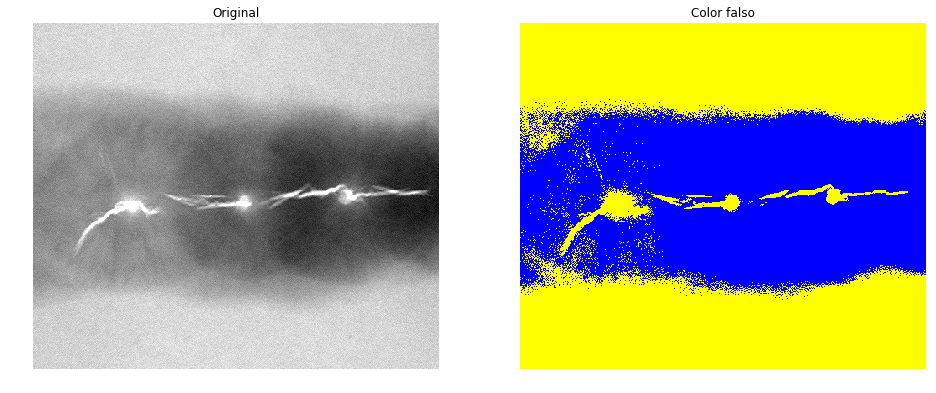

In [75]:
def False_Color(img,Th): 
    h,w    = img.shape                  # Se guarda el tamaño de la imagen
    imgt   = np.zeros((h,w,3))          # Se crea una matriz de zeros donde se guardan los colores y las posiciones de 
                                        # la nueva imagen
    for i in range(h):                  # Se recorre toda la iamgen
        for j in range(w):
            if img[i][j]<Th:            # Se compara el valor del pixel con el threshold
                imgt[i][j][0]   = 255   # Se agrega azul en el pixel que esta por debajo del limite
            else: 
                imgt[i][j][1:3] = 255   # Se agrega amarillo en el pixel que esta por arriab del limite
                
    imgt   = cv2.cvtColor(imgt.astype(np.uint8), cv2.COLOR_BGR2RGB) # Se transforma la matris de azul en una imagen
    
    return imgt

T = 170  # Threshold 

img = cv2.imread(images[20],cv2.IMREAD_GRAYSCALE)
fal = False_Color(img,T)                # Se utiliza la funcion aplica el color falso con la funcion False_Color()

plt.figure(figsize=(16,16))

plt.subplot(1,2,1)
plt.imshow(img,cmap="gray")
plt.axis("off")
plt.title("Original")                   # Se muestra la imagen Original


plt.subplot(1,2,2)
plt.imshow(fal)
plt.axis("off")
plt.title("Color falso")                # Se muestra la imagen Modificada

plt.show()

## Problem 7

Green screen effects. Write a function that replaces the green background of the image <tt>hiro.jpg</tt> with a background image of your choice.

<img src="files/hiro.jpg" width=300>

c:\users\sebastian\miniconda3\lib\site-packages\ipykernel_launcher.py:22: RuntimeWarning: overflow encountered in ubyte_scalars


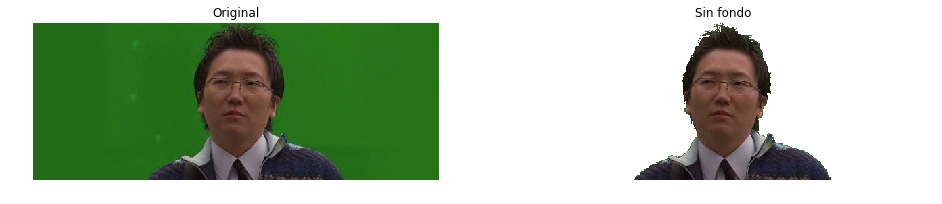

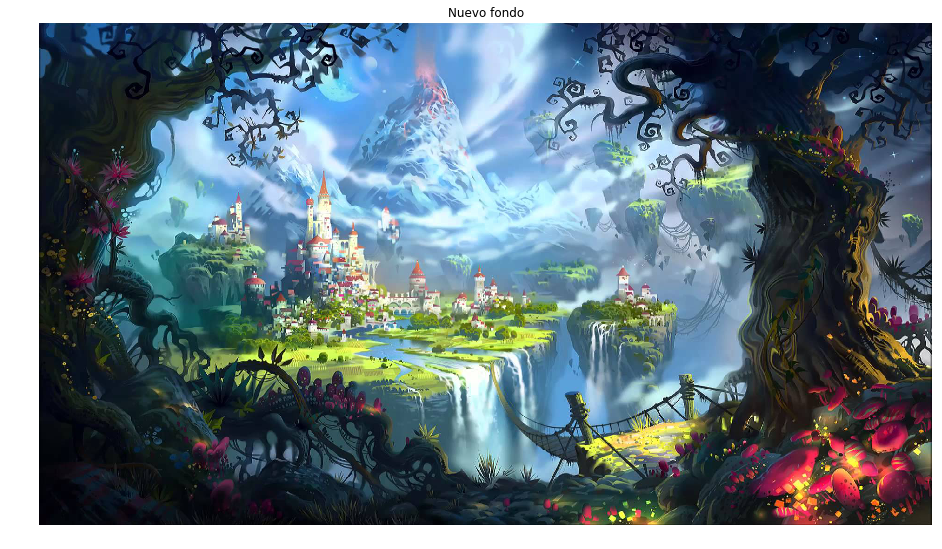

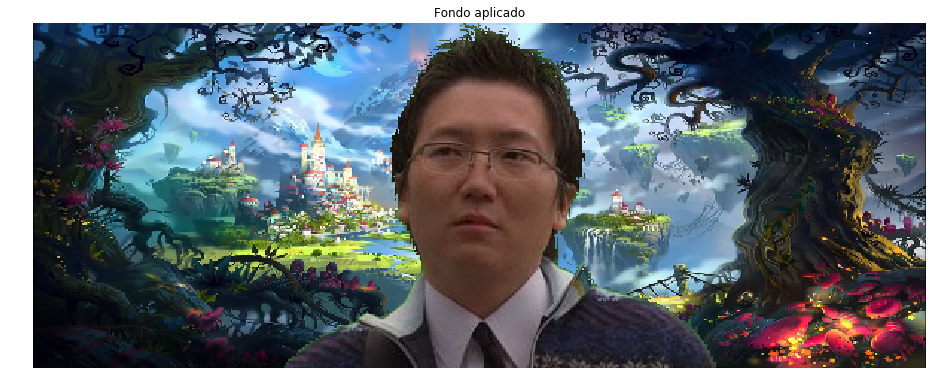

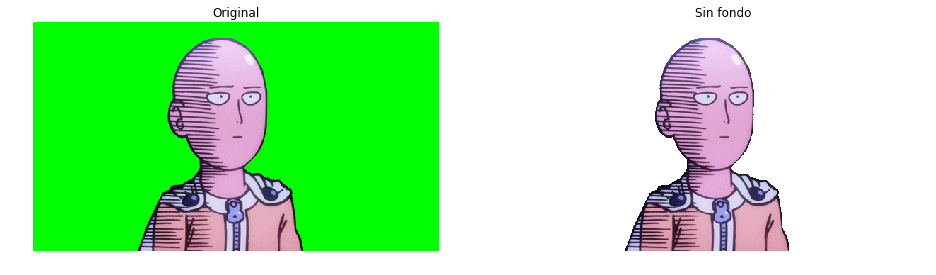

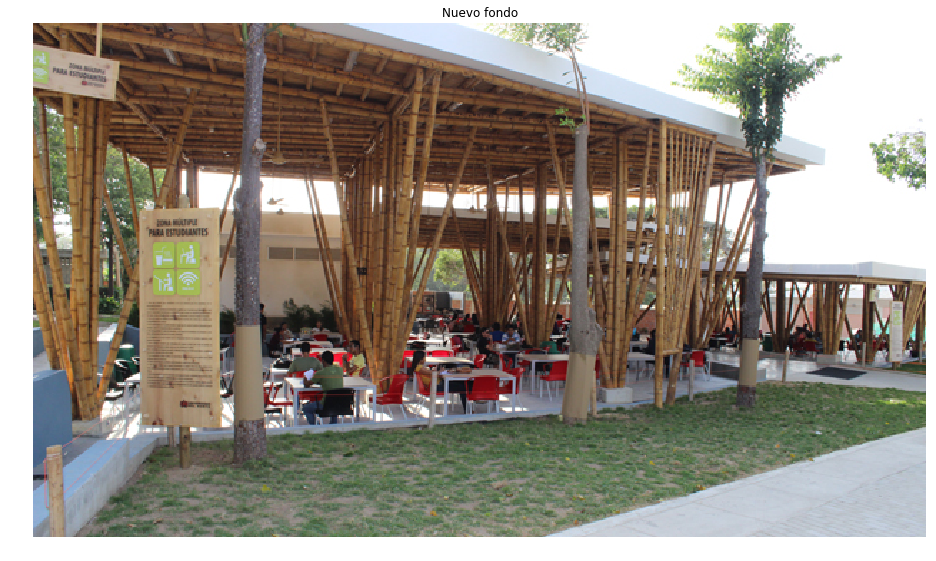

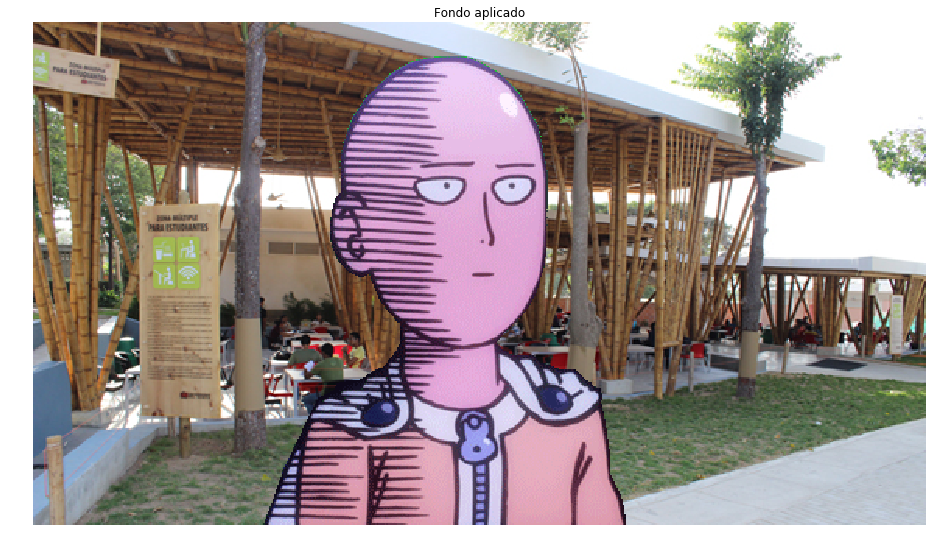

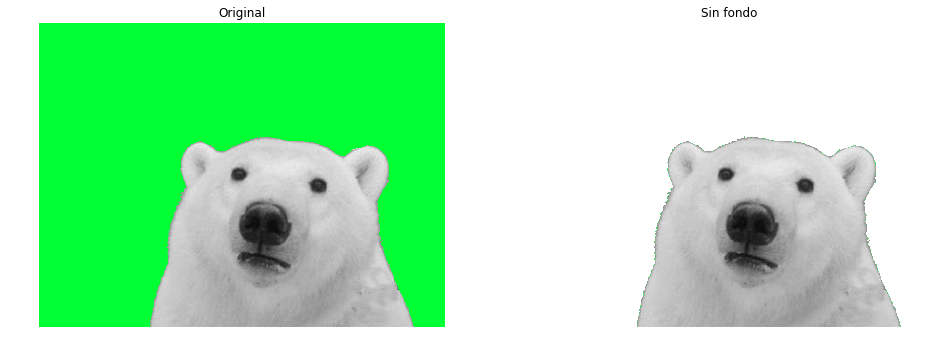

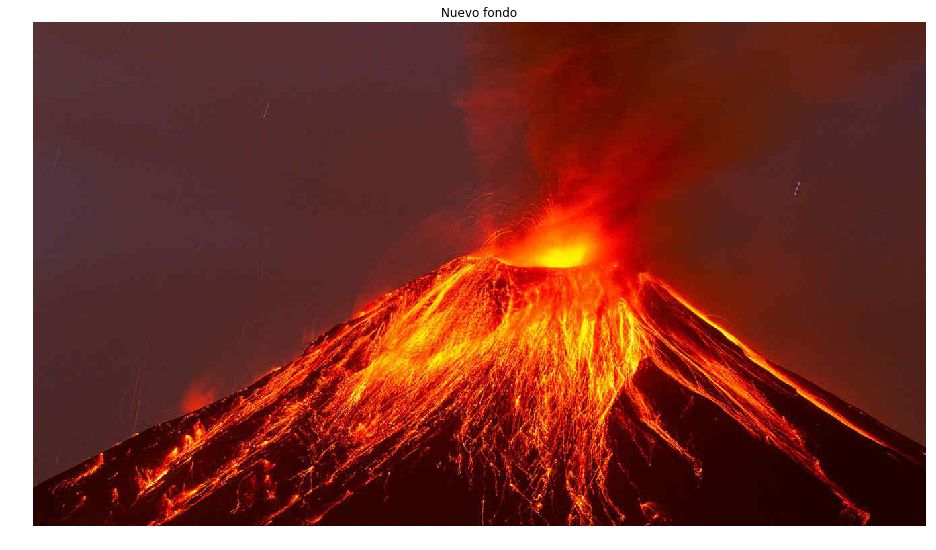

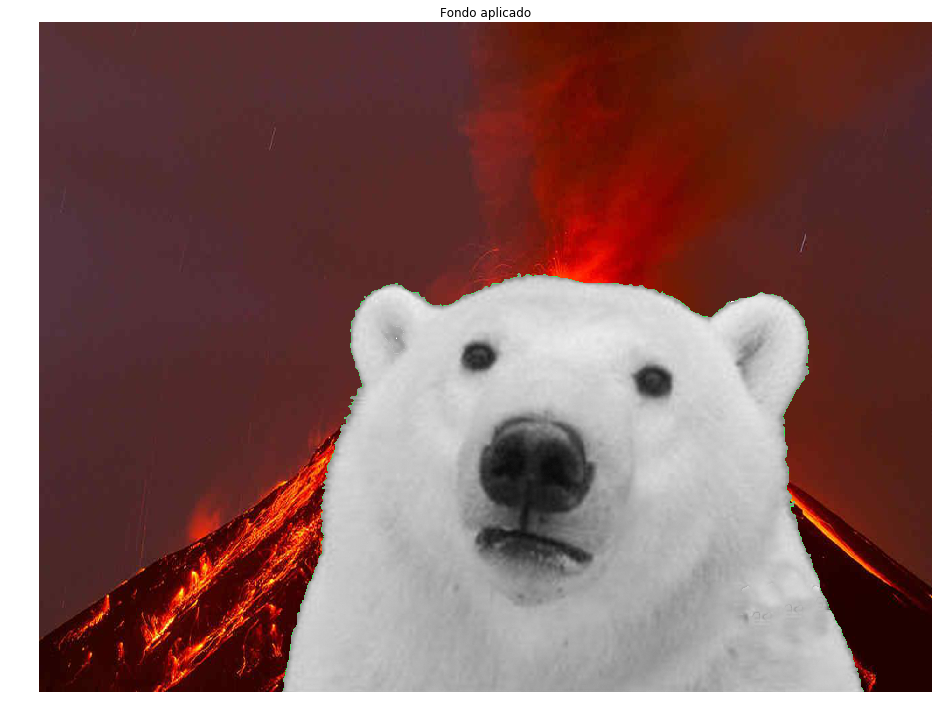

In [76]:
def add_background(imgp,backp):
    h, w, _ = imgp.shape
    backp   = cv2.resize(backp,(w, h), interpolation = cv2.INTER_CUBIC) # Se ajusta el tamaño de la imagen de fondo 
                                                                        # al de la imagen a modificar
    imgb    = imgp.copy()

    for i in range(h):                                                  # Se recorre toda la imagen original
        for j in range(w):
            pix     = imgp[i][j]
            max_pix = np.max(pix)
            
            # Para reemplazar el fondo de la imagen por el escogido es nesesario identificarlo primero.
            # Este no es verde puro, sino que en relaidad tiene ciertas componentes de rojo y azul.
            # Para filtrar el fondo primero se mira si la componente verde es la mas prominente de las tres (RGB), 
            # puesto que esto nos da una pista de si es fondo o no.
            # Luego se mira que tan promimente es el color verde comparado con el rojo y el azul.
            # Para esto primero se mira si son menores que 60 (Valor hallado de forma practica),
            # luego suman, se dividen por una constante (1.2 en este caso) y se comparan con la componente verde del pixel.
            # Esto nos dice si el color azul y verde no son lo suficientemente intesos y al comparar el color verde del pixel
            # con la operacion anterior nos dice que tan verde es el pixel. Con esto sabemos si estamos
            
            if pix[1]>((pix[0]+pix[2])/1.2) and max_pix==pix[1] and pix[0]<60 and pix[2]<60:
                imgp[i][j]=backp[i][j]
                imgb[i][j]=255
    
    return [imgp,imgb]                                                  # Se regresa la imagen modifciada y la imagen sin fondo

imgarray=[7,13,19]
backarray=["back3.jpg","backu.jpg","backv.jpg"]

for i in range(0,3):

    img=cv2.imread(images[imgarray[i]],cv2.IMREAD_COLOR)       # Se carga la imagen original
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

    back=cv2.imread(backarray[i],cv2.IMREAD_COLOR)    # Se carga el fondo
    back=cv2.cvtColor(back,cv2.COLOR_BGR2RGB)

    [img_new,img_blank]=add_background(img,back)     # Se se aplcia el fondo a la imagen orignal

    img=cv2.imread(images[imgarray[i]],cv2.IMREAD_COLOR)       # Se carga la imagen original
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(16,16))
    plt.subplot(1,2,1)
    plt.imshow(img)                                  # Se muestra la imagen Original
    plt.axis("off")
    plt.title("Original")

    plt.subplot(1,2,2)
    plt.imshow(img_blank)                            # Se muestra la imagen original sin fondo
    plt.axis("off")
    plt.title("Sin fondo")

    plt.show()

    plt.figure(figsize=(16,16))
    plt.imshow(back)                                 # Se muestra el fondo
    plt.axis("off")
    plt.title("Nuevo fondo")


    plt.show()
    plt.figure(figsize=(16,16))
    plt.imshow(img_new)                              # Se muestra la imagen modificada
    plt.axis("off")
    plt.title("Fondo aplicado")
    plt.show()

